In [1]:
import numpy as np
import pandas as pd
import datetime
from dateutil.parser import parse
import requests, re, time
import pandas_datareader
import pickle
import math

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import seaborn as sns 
import geopandas as gpd

import statsmodels.api as sm
import json
from pandas.io.json import json_normalize
from bs4 import BeautifulSoup
from selenium import webdriver
import time

import geopy.distance

In [5]:
Apartments = pickle.load(open('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Pickles/Apartment Data 4.pkl','rb'))
# Removing apartments having mistakes in coordinates; if API can't recognize the address, the location is somewhere in the USA (having a longitude of c. -100)
Apartments = Apartments[(Apartments['longitude'] > 0)]

In [6]:
MetroList = pickle.load(open('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Pickles/Metrolist With Coordinates.pkl','rb'))

In [7]:
# Defining new rows of coordinates:
Apartments['latitude'] = [Apartments['Coordinates'][i][0] for i in range(0,len(Apartments))]
Apartments['longitude'] = [Apartments['Coordinates'][i][1] for i in range(0,len(Apartments))]
MetroList['latitude'] = [MetroList['Coordinates'][i][0] for i in range(0,len(MetroList))]
MetroList['longitude'] = [MetroList['Coordinates'][i][1] for i in range(0,len(MetroList))]

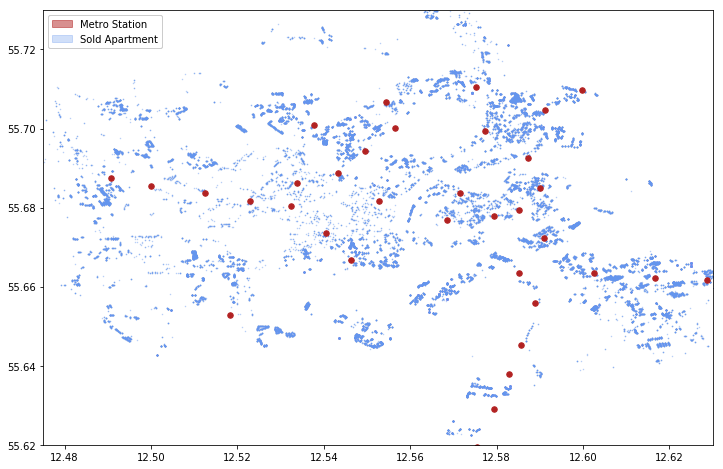

In [20]:
fig, ax1 = plt.subplots(figsize=(12,8), frameon=False)
title_font = {'size':'16', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'}

#plt.title('Condos sold in Copenhagen',**title_font)

#Plotting wheat price:
ax1.scatter(x=Apartments['longitude'], y=Apartments['latitude'],c='cornflowerblue',label='Sold Apartment',s=0.2,alpha=0.5)

ax1.scatter(x=MetroList['longitude'], y=MetroList['latitude'], c='firebrick',label='Metro',s=30)
BBox = (12.475, 12.63, 55.62, 55.73)
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])

# image = plt.imread('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/map2.png')
# ax1.imshow(image, zorder=0, extent = BBox, aspect= 'equal')
plt.tick_params()


cph.plot(color='#d7d7d7',edgecolor='black', ax=ax, label = "CPH Municipality")
frb.plot(color='#e5e5e5', edgecolor='blue',  ax=ax, label = "FRB Municipality")


blue = mpatches.Patch(color='cornflowerblue', label='Sold Apartment',alpha=0.3)
red = mpatches.Patch(color='firebrick', label='Metro Station',alpha=0.5)

legend1 = plt.legend(handles=[red, blue], loc='upper left', frameon=True, framealpha=1)
ax1.add_artist(legend1)

plt.savefig('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/Condo Map.pdf')


# Using GeoPandas

In [60]:
# Using the GeoPandas-data for danish communals:
admin_dk_repo = 'https://raw.githubusercontent.com/ok-dk/dagi/master/geojson/'

# Collecting:
Municipalities = gpd.read_file(admin_dk_repo+'kommuner.geojson')

In [61]:
Municipalities.columns = Municipalities.columns.str.lower()
Municipalities.to_crs(epsg=25832, inplace=True)    #to eastern northing

In [62]:
cph = Municipalities[(Municipalities['komnavn'] == 'København')]
frb = Municipalities[(Municipalities['komnavn'] == 'Frederiksberg')]

In [65]:
#make geodataframe of houseprice data
gdf = gpd.GeoDataFrame(
    Apartments, geometry=gpd.points_from_xy(Apartments.longitude, Apartments.latitude), crs = {'init': 'epsg:4326'})
gdf.to_crs(epsg=25832, inplace=True)    #to eastern northing

In [66]:
#make geodataframe of metrostations
gdf_metro = gpd.GeoDataFrame(
    MetroList, geometry=gpd.points_from_xy(MetroList.longitude, MetroList.latitude), crs = {'init': 'epsg:4326'})
gdf_metro.to_crs(epsg=25832, inplace=True)    #to eastern northing

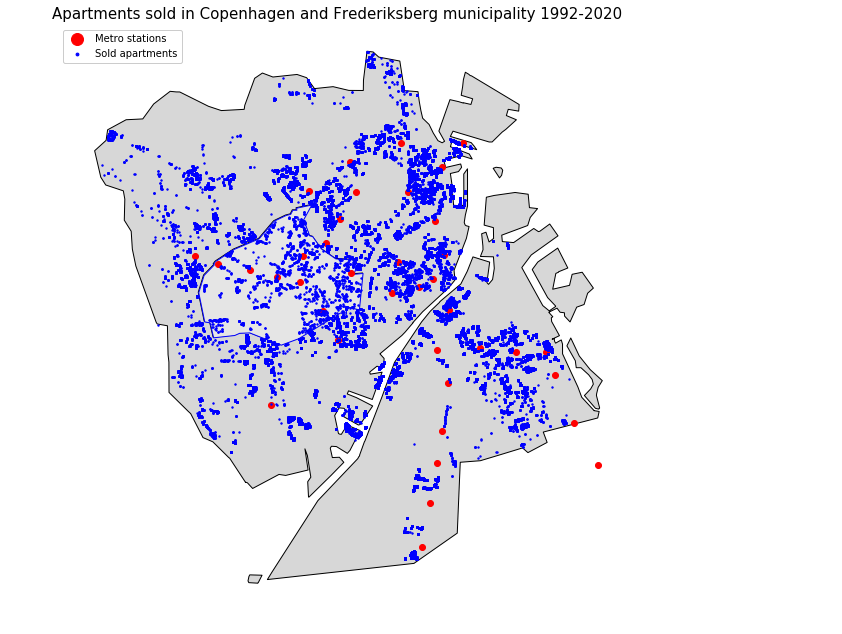

In [84]:
fig, ax = plt.subplots(figsize=(10, 15))

# Plotting municipalities
cph.plot(color='#d7d7d7',edgecolor='black', ax=ax, label = "CPH Municipality")
frb.plot(color='#e5e5e5', edgecolor='blue',  ax=ax, label = "FRB Municipality")


gdf_metro.plot(ax = ax, color = "red", label = "Metro stations")
gdf.plot(ax=ax, color = "blue", markersize=2,  label = "Sold apartments")


#narrow xlim
ax.set_axis_off()
ax.set_title('Apartments sold in Copenhagen and Frederiksberg municipality 1992-2020', fontsize=15)

#handle legend 
plt.legend(loc='upper left',frameon=True,markerscale=2,framealpha=1)
ax.set_xlim([716000, 730000])

plt.savefig('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/Condo Map Geopandas.pdf')

plt.show()
